<a href="https://colab.research.google.com/github/gabrieldimas/machine-learning-study-2023/blob/main/ktp_ocr_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
import glob
import imutils
from imutils import contours
import joblib

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


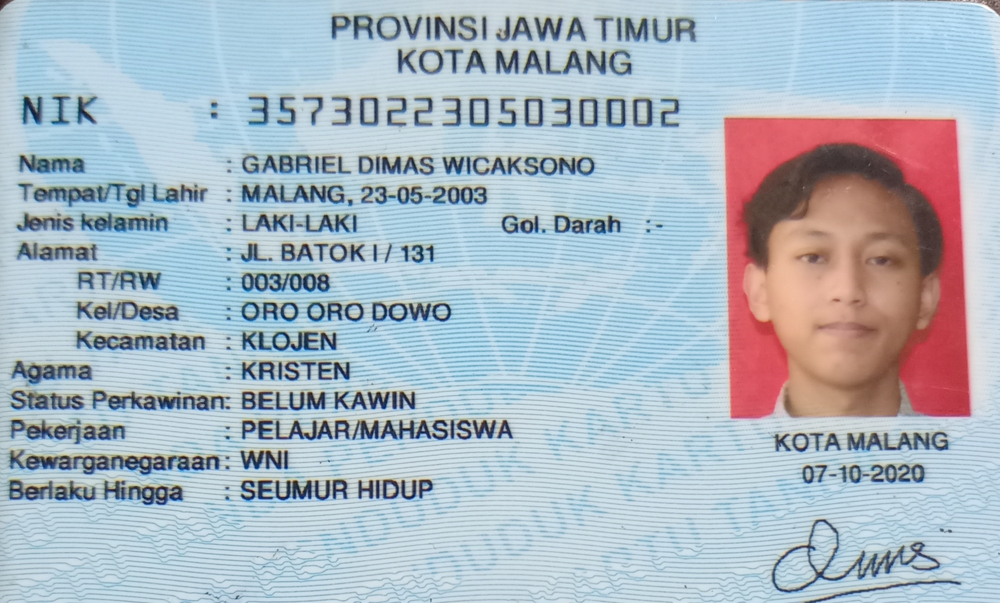

In [43]:
ori_img = cv2.imread('/content/drive/MyDrive/Kuliah/MachineLearning/Tubes/ktp_gabriel2.jpg')
ori_img = imutils.resize(ori_img,width=2560)
cv2_imshow(ori_img)

In [44]:
def filter_image(img):
  gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
  clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(12, 12))
  clahed = clahe.apply(gray)
  gaussian = cv2.GaussianBlur(clahed,(3,3),0)
  median = cv2.medianBlur(gaussian,7)
  thresholded = cv2.threshold(median,165,255,cv2.THRESH_TRUNC + cv2.THRESH_OTSU)[1]
  binary = cv2.threshold(thresholded,127,255,cv2.THRESH_BINARY_INV)[1]

  return binary

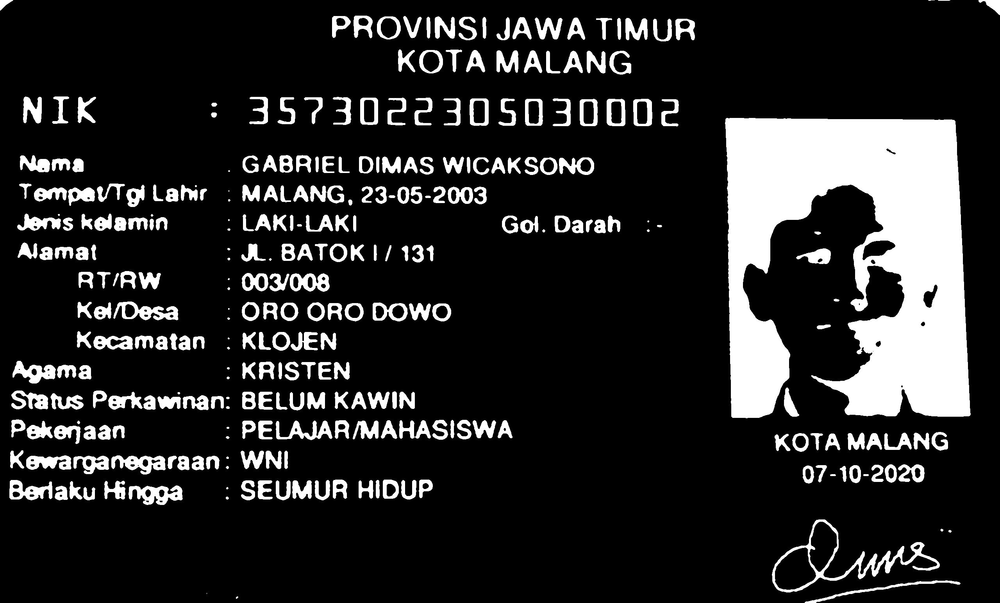

In [45]:
filtered_img = filter_image(ori_img.copy())
cv2_imshow(filtered_img)

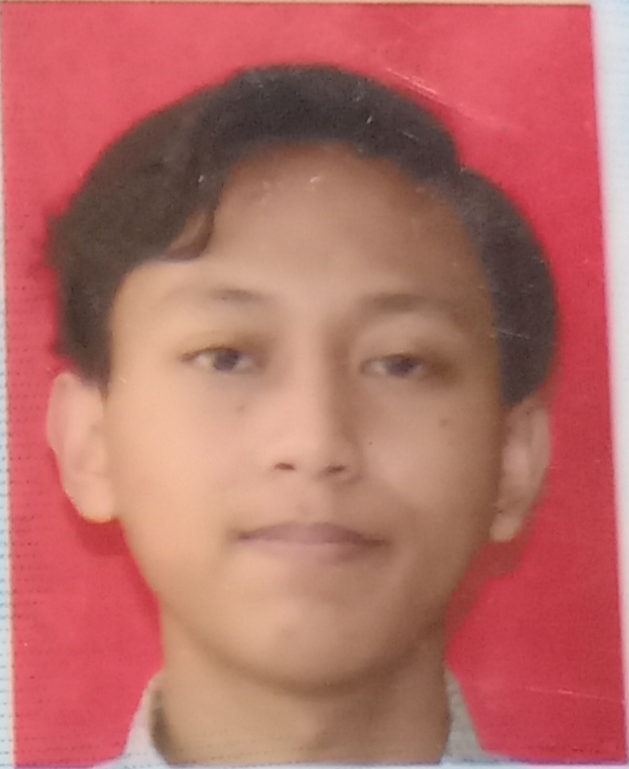

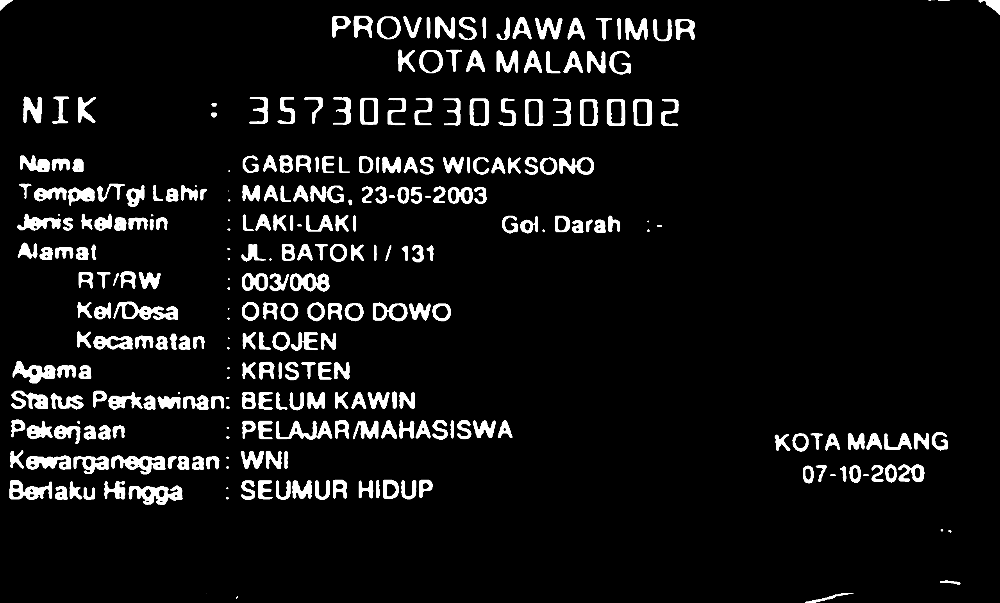

In [46]:
cnts = cv2.findContours(filtered_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="left-to-right")[0]


largest_areas = sorted(cnts, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_areas[-1])
cv2.rectangle(filtered_img, (x, y), (x + w, y + h+30), (0, 0, 0), -1)
resized = imutils.resize(ori_img,width=2560)
foto_ktp = resized[y:y+h, x:x+w]

# remove big chunk
for cnt in cnts:
  x, y, w, h = cv2.boundingRect(cnt)
  if(w > 100 and  h > 100):
    cv2.rectangle(filtered_img, (x, y), (x + w, y + h), (0, 0, 0), -1)

cv2_imshow(foto_ktp)
cv2_imshow(filtered_img)



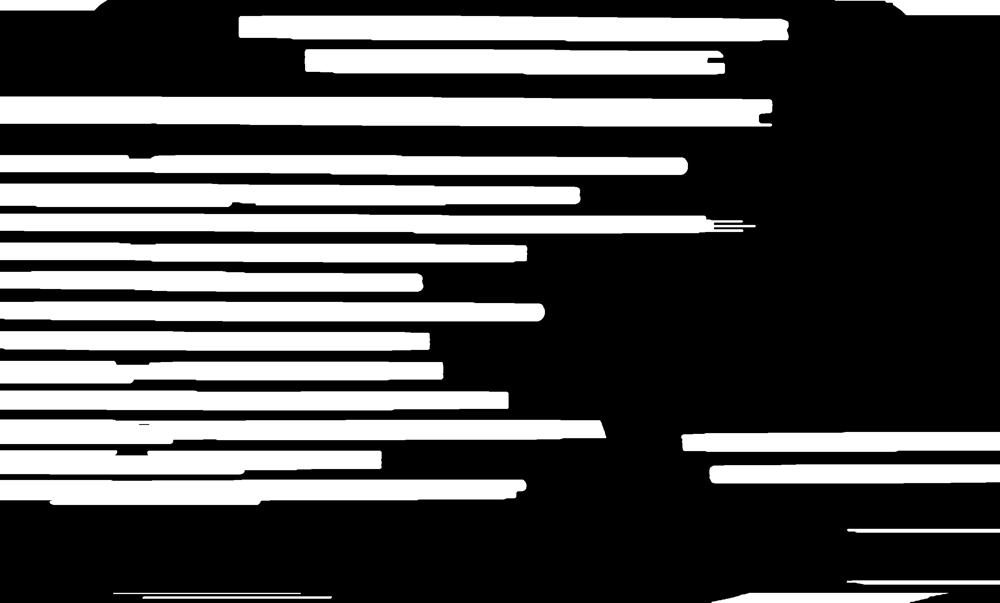

In [47]:
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (480,1))
dilation = cv2.dilate(filtered_img, rect_kernel, iterations = 1)
cv2_imshow(dilation)

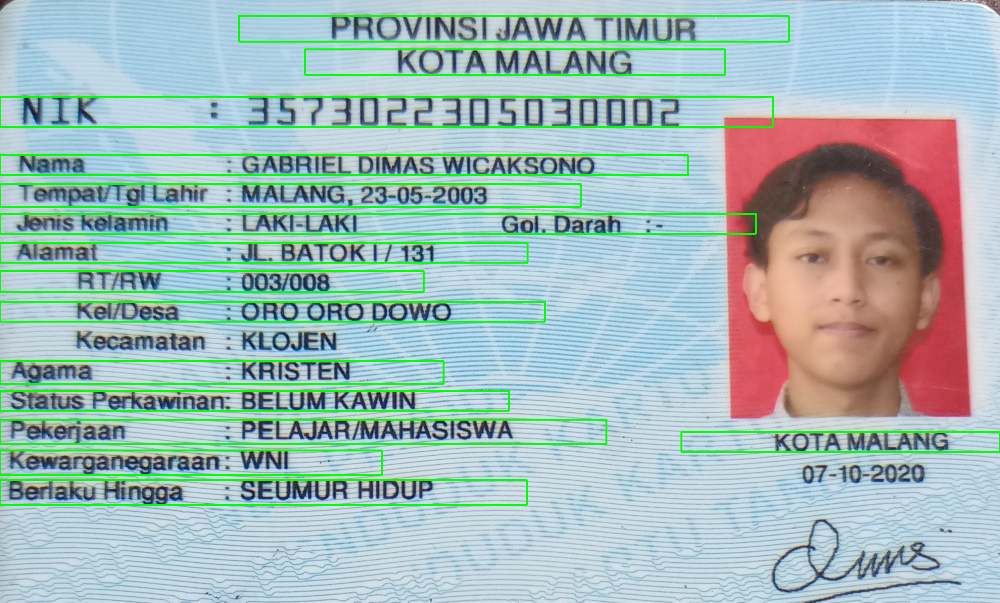

In [48]:
cnts = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="top-to-bottom")[0]
im2 = ori_img.copy()
ktp_roi=[]

for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(50 < w and 50 < h < 100):
          cv2.rectangle(im2, (x, y), (x + w, y + h), (0, 255, 0), 4)
          ktp_roi.append(filtered_img[y:y+h, x:x+w])
cv2_imshow(im2)

In [49]:
from tensorflow.keras.models import load_model

model_path = "/content/drive/MyDrive/Kuliah/MachineLearning/Tubes/network"

model = load_model(model_path)


# class_mapping = {
#     0: '0', 1: '1', 2: '2', 3: '3', 4: '4',
#     5: '5', 6: '6', 7: '7', 8: '8', 9: '9',
#     10: 'A', 11: 'B', 12: 'C', 13: 'D', 14: 'E',
#     15: 'F', 16: 'G', 17: 'H', 18: 'I', 19: 'J',
#     20: 'K', 21: 'L', 22: 'M', 23: 'N', 24: 'O',
#     25: 'P', 26: 'Q', 27: 'R', 28: 'S', 29: 'T',
#     30: 'U', 31: 'V', 32: 'W', 33: 'X', 34: 'Y', 35: 'Z'
# }
# class_mapping = [
#     '!', '"', '#', '$', '%', '&', "'", '(', ')', '*',
#     '+', ',', '-', '.', '/', '0', '1', '2', '3', '4',
#     '5', '6', '7', '8', '9', ':', ';', '<', '=', '>',
#     '?', '@', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H',
#     'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R',
#     'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'W', 'X',
#     'Y', 'Z', '!', '"', 'a', 'b', 'c', 'd', "e", 'f',
#     'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p',
#     'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z',
#     '{', '|', '}', '~']

class_mapping = ['6',  'D',  'f',  '/',  'F',  'x',  'J',  '8',  'H',  'k',  '1',
                 'g',  '2',  'd',  '3',  't',  '.',  '4',  'o',  'y',  'A',
                 'u',  'G',  '-',  'm',  'W',  'c',  '9',  'N',  'P',  'X',
                  'h',  '7',  'j',  '5',  'b',  'w',  'l',  '0',  'I',  'Y',
                   ':',  'T',  'K',  'E',  'V',  'M',  'S',  'a',  'i',  'r',
                    'p',  'e',  'U',  's', 'C',  'q',  'n',  'B',  'z',  'v',
                     'O',  'R',  'Z',  'Q',  'L']
def get_text_roi(image):
  text_roi=[]
  cnts = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]

  for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(w > 4 and h > 20):
          padded = cv2.copyMakeBorder(image[y:y+h, x:x+w],20,20,20,20, cv2.BORDER_CONSTANT)


          padded = cv2.resize(padded,(28,28))
          # padded = 255 - padded
          cv2_imshow(padded)
          pad = np.array(padded)
          pad = pad / 255.0
          pad_vector = pad.reshape((-1, 1))
          padded = pad_vector.reshape(-1, 28, 28, 1)

          pred = model.predict(padded)
          pred_conf = np.amax(pred)
          pred_index = np.argmax(pred)
          print(f'model pred idx: {pred_index}')
          print(f'model pred conf: {pred_conf}')
          print(f'model pred label: {class_mapping[pred_index]}')
          text_roi.append(f'{class_mapping[pred_index]}')
  return text_roi

In [50]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [51]:
def grab_text(ktp_roi,index):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,40))
  dlt = cv2.dilate(ktp_roi, rect_kernel, iterations = 1)

  cnts = cv2.findContours(dlt, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]
  x, y, w, h = cv2.boundingRect(cnts[index])

  return ktp_roi[y:y+h, x:x+w]

1/1 [==============================] - 0s 195ms/step
model pred idx: 25
model pred conf: 0.9999980926513672
model pred label: W


1/1 [==============================] - 0s 32ms/step
model pred idx: 27
model pred conf: 0.6214296221733093
model pred label: 9


1/1 [==============================] - 0s 48ms/step
model pred idx: 0
model pred conf: 0.6396332383155823
model pred label: 6


1/1 [==============================] - 0s 46ms/step
model pred idx: 31
model pred conf: 0.9917829036712646
model pred label: h


1/1 [==============================] - 0s 29ms/step
model pred idx: 1
model pred conf: 0.9973289966583252
model pred label: D


1/1 [==============================] - 0s 30ms/step
model pred idx: 23
model pred conf: 0.9999974966049194
model pred label: -


1/1 [==============================] - 0s 51ms/step
model pred idx: 28
model pred conf: 0.9056981801986694
model pred label: N


1/1 [==============================] - 0s 38ms/step
model pred idx: 1
model pred conf: 0.9982695579528809
model pred label: D


1/1 [==============================] - 0s 25ms/step
model pred idx: 19
model pred conf: 0.9970313310623169
model pred label: y


1/1 [==============================] - 0s 39ms/step
model pred idx: 10
model pred conf: 0.9999943971633911
model pred label: 1


1/1 [==============================] - 0s 56ms/step
model pred idx: 23
model pred conf: 0.5173103213310242
model pred label: -


1/1 [==============================] - 0s 69ms/step
model pred idx: 10
model pred conf: 0.9999864101409912
model pred label: 1


1/1 [==============================] - 0s 30ms/step
model pred idx: 29
model pred conf: 0.996381402015686
model pred label: P


1/1 [==============================] - 0s 30ms/step
model pred idx: 1
model pred conf: 0.9996682405471802
model pred label: D


1/1 [==============================] - 0s 29ms/step
model pred idx: 22
model pred conf: 0.3693412244319916
model pred label: G


1/1 [==============================] - 0s 31ms/step
model pred idx: 30
model pred conf: 0.9786660671234131
model pred label: X


1/1 [==============================] - 0s 30ms/step
model pred idx: 10
model pred conf: 0.8994183540344238
model pred label: 1


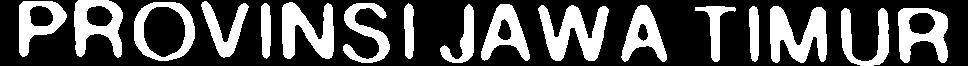

tesseract -  : 
custom result -  : W96hD-NDy1-1PDGX1


1/1 [==============================] - 0s 29ms/step
model pred idx: 20
model pred conf: 0.9961510896682739
model pred label: A


1/1 [==============================] - 0s 26ms/step
model pred idx: 0
model pred conf: 0.6515861749649048
model pred label: 6


1/1 [==============================] - 0s 69ms/step
model pred idx: 29
model pred conf: 0.9999933242797852
model pred label: P


1/1 [==============================] - 0s 33ms/step
model pred idx: 10
model pred conf: 0.9999994039535522
model pred label: 1


1/1 [==============================] - 0s 33ms/step
model pred idx: 23
model pred conf: 0.4803697168827057
model pred label: -


1/1 [==============================] - 0s 37ms/step
model pred idx: 10
model pred conf: 0.9999921321868896
model pred label: 1


1/1 [==============================] - 0s 25ms/step
model pred idx: 21
model pred conf: 0.9999967813491821
model pred label: u


1/1 [==============================] - 0s 35ms/step
model pred idx: 10
model pred conf: 0.9999711513519287
model pred label: 1


1/1 [==============================] - 0s 29ms/step
model pred idx: 23
model pred conf: 0.9999994039535522
model pred label: -


1/1 [==============================] - 0s 31ms/step
model pred idx: 16
model pred conf: 0.9997848868370056
model pred label: .


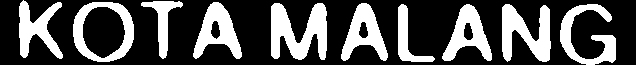

tesseract -  : KOTA MALANG

custom result -  : A6P1-1u1-.


1/1 [==============================] - 0s 92ms/step
model pred idx: 3
model pred conf: 0.9989103078842163
model pred label: /


1/1 [==============================] - 0s 29ms/step
model pred idx: 5
model pred conf: 0.998773992061615
model pred label: x


1/1 [==============================] - 0s 45ms/step
model pred idx: 7
model pred conf: 0.9999829530715942
model pred label: 8


1/1 [==============================] - 0s 44ms/step
model pred idx: 3
model pred conf: 0.9581500887870789
model pred label: /


1/1 [==============================] - 0s 38ms/step
model pred idx: 13
model pred conf: 0.9783172607421875
model pred label: d


1/1 [==============================] - 0s 31ms/step
model pred idx: 2
model pred conf: 0.8102617859840393
model pred label: f


1/1 [==============================] - 0s 29ms/step
model pred idx: 2
model pred conf: 0.8035697340965271
model pred label: f


1/1 [==============================] - 0s 78ms/step
model pred idx: 3
model pred conf: 0.9948321580886841
model pred label: /


1/1 [==============================] - 0s 51ms/step
model pred idx: 13
model pred conf: 0.9877707958221436
model pred label: d


1/1 [==============================] - 0s 77ms/step
model pred idx: 5
model pred conf: 0.863103985786438
model pred label: x


1/1 [==============================] - 0s 40ms/step
model pred idx: 13
model pred conf: 0.9858711361885071
model pred label: d


1/1 [==============================] - 0s 49ms/step
model pred idx: 3
model pred conf: 0.9991550445556641
model pred label: /


1/1 [==============================] - 0s 42ms/step
model pred idx: 13
model pred conf: 0.8514840602874756
model pred label: d


1/1 [==============================] - 0s 34ms/step
model pred idx: 13
model pred conf: 0.9423875212669373
model pred label: d


1/1 [==============================] - 0s 37ms/step
model pred idx: 13
model pred conf: 0.9529250860214233
model pred label: d


1/1 [==============================] - 0s 26ms/step
model pred idx: 2
model pred conf: 0.6817709803581238
model pred label: f


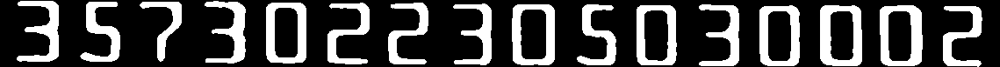

tesseract -  : Epo ian telex neneye

3000-2

custom result -  : /x8/dff/dxd/dddf


1/1 [==============================] - 0s 18ms/step
model pred idx: 16
model pred conf: 0.9970535039901733
model pred label: .


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9991322159767151
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 11
model pred conf: 0.5740115642547607
model pred label: g


1/1 [==============================] - 0s 19ms/step
model pred idx: 10
model pred conf: 0.9991191029548645
model pred label: 1


1/1 [==============================] - 0s 18ms/step
model pred idx: 1
model pred conf: 0.9996175765991211
model pred label: D


1/1 [==============================] - 0s 27ms/step
model pred idx: 14
model pred conf: 0.9994829893112183
model pred label: 3


1/1 [==============================] - 0s 16ms/step
model pred idx: 21
model pred conf: 0.9999570846557617
model pred label: u


1/1 [==============================] - 0s 17ms/step
model pred idx: 13
model pred conf: 0.7394356727600098
model pred label: d


1/1 [==============================] - 0s 26ms/step
model pred idx: 1
model pred conf: 0.9994704127311707
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.5075611472129822
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9886488318443298
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 28
model pred conf: 0.9682102203369141
model pred label: N


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.716263473033905
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 1
model pred conf: 0.9999387264251709
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 12
model pred conf: 0.9992921352386475
model pred label: 2


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9925937056541443
model pred label: 1


1/1 [==============================] - 0s 19ms/step
model pred idx: 20
model pred conf: 0.9953553676605225
model pred label: A


1/1 [==============================] - 0s 26ms/step
model pred idx: 28
model pred conf: 0.8964349627494812
model pred label: N


1/1 [==============================] - 0s 26ms/step
model pred idx: 24
model pred conf: 0.508307158946991
model pred label: m


1/1 [==============================] - 0s 31ms/step
model pred idx: 23
model pred conf: 0.6957756280899048
model pred label: -


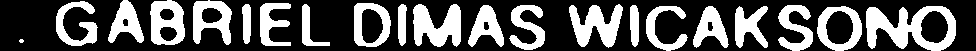

tesseract -  : . GABRIEL DIMAS WICAK SONO

custom result -  : .1g1D3udD-1N-D21ANm-


1/1 [==============================] - 0s 24ms/step
model pred idx: 23
model pred conf: 0.585067868232727
model pred label: -


1/1 [==============================] - 0s 28ms/step
model pred idx: 10
model pred conf: 0.99704509973526
model pred label: 1


1/1 [==============================] - 0s 24ms/step
model pred idx: 21
model pred conf: 0.9973787069320679
model pred label: u


1/1 [==============================] - 0s 24ms/step
model pred idx: 10
model pred conf: 0.9925718903541565
model pred label: 1


1/1 [==============================] - 0s 24ms/step
model pred idx: 23
model pred conf: 0.3079747259616852
model pred label: -


1/1 [==============================] - 0s 25ms/step
model pred idx: 2
model pred conf: 0.9979231953620911
model pred label: f


1/1 [==============================] - 0s 25ms/step
model pred idx: 3
model pred conf: 0.9999926090240479
model pred label: /


1/1 [==============================] - 0s 27ms/step
model pred idx: 24
model pred conf: 0.5717893838882446
model pred label: m


1/1 [==============================] - 0s 25ms/step
model pred idx: 5
model pred conf: 0.7408439517021179
model pred label: x


1/1 [==============================] - 0s 25ms/step
model pred idx: 2
model pred conf: 0.9933373928070068
model pred label: f


1/1 [==============================] - 0s 24ms/step
model pred idx: 30
model pred conf: 0.2730177640914917
model pred label: X


1/1 [==============================] - 0s 25ms/step
model pred idx: 3
model pred conf: 0.9999817609786987
model pred label: /


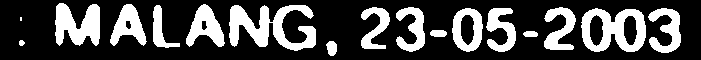

tesseract -  : 
custom result -  : -1u1-f/mxfX/


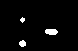

tesseract -  : 
custom result -  : 


1/1 [==============================] - 0s 25ms/step
model pred idx: 2
model pred conf: 0.4590669274330139
model pred label: f


1/1 [==============================] - 0s 24ms/step
model pred idx: 11
model pred conf: 0.8406363725662231
model pred label: g


1/1 [==============================] - 0s 24ms/step
model pred idx: 10
model pred conf: 0.989452600479126
model pred label: 1


1/1 [==============================] - 0s 23ms/step
model pred idx: 29
model pred conf: 0.9987678527832031
model pred label: P


1/1 [==============================] - 0s 23ms/step
model pred idx: 0
model pred conf: 0.5540155172348022
model pred label: 6


1/1 [==============================] - 0s 29ms/step
model pred idx: 20
model pred conf: 0.9701331257820129
model pred label: A


1/1 [==============================] - 0s 25ms/step
model pred idx: 1
model pred conf: 0.9999693632125854
model pred label: D


1/1 [==============================] - 0s 23ms/step
model pred idx: 1
model pred conf: 0.9999022483825684
model pred label: D


1/1 [==============================] - 0s 24ms/step
model pred idx: 1
model pred conf: 0.8661352396011353
model pred label: D


1/1 [==============================] - 0s 27ms/step
model pred idx: 3
model pred conf: 0.9999706745147705
model pred label: /


1/1 [==============================] - 0s 26ms/step
model pred idx: 1
model pred conf: 0.9917438626289368
model pred label: D


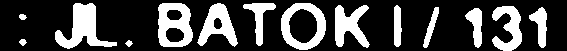

tesseract -  : 
custom result -  : fg1P6ADDD/D


1/1 [==============================] - 0s 24ms/step
model pred idx: 23
model pred conf: 0.5978400111198425
model pred label: -


1/1 [==============================] - 0s 25ms/step
model pred idx: 33
model pred conf: 0.645210325717926
model pred label: j


1/1 [==============================] - 0s 24ms/step
model pred idx: 22
model pred conf: 0.9555020928382874
model pred label: G


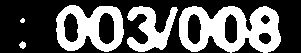

tesseract -  : 
custom result -  : -jG


1/1 [==============================] - 0s 26ms/step
model pred idx: 0
model pred conf: 0.5679413080215454
model pred label: 6


1/1 [==============================] - 0s 27ms/step
model pred idx: 10
model pred conf: 0.9980721473693848
model pred label: 1


1/1 [==============================] - 0s 24ms/step
model pred idx: 24
model pred conf: 0.5692444443702698
model pred label: m


1/1 [==============================] - 0s 25ms/step
model pred idx: 24
model pred conf: 0.5850526094436646
model pred label: m


1/1 [==============================] - 0s 23ms/step
model pred idx: 10
model pred conf: 0.8924133777618408
model pred label: 1


1/1 [==============================] - 0s 25ms/step
model pred idx: 24
model pred conf: 0.560705304145813
model pred label: m


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.3573499321937561
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.7938160300254822
model pred label: -


1/1 [==============================] - 0s 24ms/step
model pred idx: 24
model pred conf: 0.5406643748283386
model pred label: m


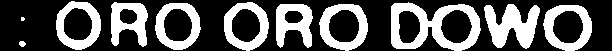

tesseract -  : 
custom result -  : 61mm1m--m


1/1 [==============================] - 0s 30ms/step
model pred idx: 20
model pred conf: 0.943091869354248
model pred label: A


1/1 [==============================] - 0s 25ms/step
model pred idx: 10
model pred conf: 0.9999823570251465
model pred label: 1


1/1 [==============================] - 0s 29ms/step
model pred idx: 1
model pred conf: 0.9996554851531982
model pred label: D


1/1 [==============================] - 0s 23ms/step
model pred idx: 28
model pred conf: 0.9634181261062622
model pred label: N


1/1 [==============================] - 0s 16ms/step
model pred idx: 29
model pred conf: 0.9992944002151489
model pred label: P


1/1 [==============================] - 0s 18ms/step
model pred idx: 14
model pred conf: 0.9999995231628418
model pred label: 3


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.9999966621398926
model pred label: -


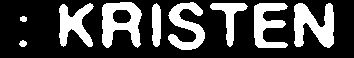

tesseract -  : 
custom result -  : A1DNP3-


1/1 [==============================] - 0s 17ms/step
model pred idx: 28
model pred conf: 0.7775042057037354
model pred label: N


1/1 [==============================] - 0s 18ms/step
model pred idx: 17
model pred conf: 0.4099065363407135
model pred label: 4


1/1 [==============================] - 0s 16ms/step
model pred idx: 25
model pred conf: 0.9919359683990479
model pred label: W


1/1 [==============================] - 0s 19ms/step
model pred idx: 16
model pred conf: 0.7000876665115356
model pred label: .


1/1 [==============================] - 0s 17ms/step
model pred idx: 2
model pred conf: 0.6444258689880371
model pred label: f


1/1 [==============================] - 0s 17ms/step
model pred idx: 22
model pred conf: 0.5510753393173218
model pred label: G


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.3807206153869629
model pred label: -


1/1 [==============================] - 0s 18ms/step
model pred idx: 23
model pred conf: 0.836673378944397
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 11
model pred conf: 0.5080346465110779
model pred label: g


1/1 [==============================] - 0s 16ms/step
model pred idx: 14
model pred conf: 0.9999992847442627
model pred label: 3


1/1 [==============================] - 0s 16ms/step
model pred idx: 21
model pred conf: 0.9979967474937439
model pred label: u


1/1 [==============================] - 0s 16ms/step
model pred idx: 30
model pred conf: 0.9944741129875183
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.5430629253387451
model pred label: -


1/1 [==============================] - 0s 19ms/step
model pred idx: 20
model pred conf: 0.9606729745864868
model pred label: A


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9998511075973511
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.9717278480529785
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 1
model pred conf: 0.9478238821029663
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.9999997615814209
model pred label: -


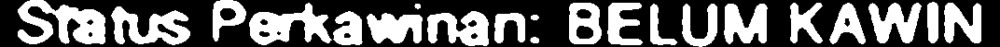

tesseract -  : 
custom result -  : N4W.fG--g3uX-A1-D-


1/1 [==============================] - 0s 17ms/step
model pred idx: 25
model pred conf: 0.9630756974220276
model pred label: W


1/1 [==============================] - 0s 18ms/step
model pred idx: 14
model pred conf: 0.9999922513961792
model pred label: 3


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.34477829933166504
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9963266253471375
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.6012251973152161
model pred label: -


1/1 [==============================] - 0s 19ms/step
model pred idx: 10
model pred conf: 0.9994223117828369
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 17
model pred conf: 0.8805105090141296
model pred label: 4


1/1 [==============================] - 0s 16ms/step
model pred idx: 28
model pred conf: 0.9760982394218445
model pred label: N


1/1 [==============================] - 0s 16ms/step
model pred idx: 1
model pred conf: 0.9772323966026306
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 28
model pred conf: 0.9911352396011353
model pred label: N


1/1 [==============================] - 0s 16ms/step
model pred idx: 32
model pred conf: 0.8632771372795105
model pred label: 7


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9980624318122864
model pred label: 1


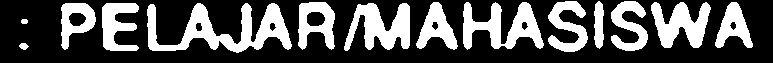

tesseract -  : : PELAJAR/MAHASISWA

custom result -  : W3X1-14NDN71


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9874565005302429
model pred label: A


1/1 [==============================] - 0s 17ms/step
model pred idx: 24
model pred conf: 0.8505399227142334
model pred label: m


1/1 [==============================] - 0s 17ms/step
model pred idx: 29
model pred conf: 0.9972534775733948
model pred label: P


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9999656677246094
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.40658748149871826
model pred label: -


1/1 [==============================] - 0s 20ms/step
model pred idx: 10
model pred conf: 0.9998682737350464
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.9861326217651367
model pred label: X


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.9999974966049194
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.6130610704421997
model pred label: m


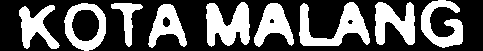

tesseract -  : 
custom result -  : AmP1-1X-m


1/1 [==============================] - 0s 18ms/step
model pred idx: 33
model pred conf: 0.6000263094902039
model pred label: j


1/1 [==============================] - 0s 17ms/step
model pred idx: 22
model pred conf: 0.9217125177383423
model pred label: G


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.7941148281097412
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 22
model pred conf: 0.893028974533081
model pred label: G


1/1 [==============================] - 0s 16ms/step
model pred idx: 12
model pred conf: 0.8071203231811523
model pred label: 2


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.5580750703811646
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 3
model pred conf: 0.5232304930686951
model pred label: /


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.8369319438934326
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 32
model pred conf: 0.527492344379425
model pred label: 7


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.9999997615814209
model pred label: -


1/1 [==============================] - 0s 25ms/step
model pred idx: 1
model pred conf: 0.9994409680366516
model pred label: D


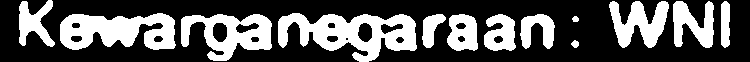

tesseract -  : Kewarganegaraan: WNI

custom result -  : jG1G2m/-7-D


1/1 [==============================] - 0s 17ms/step
model pred idx: 28
model pred conf: 0.9827032089233398
model pred label: N


1/1 [==============================] - 0s 17ms/step
model pred idx: 14
model pred conf: 0.9999997615814209
model pred label: 3


1/1 [==============================] - 0s 18ms/step
model pred idx: 30
model pred conf: 0.9975844621658325
model pred label: X


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.8296712040901184
model pred label: X


1/1 [==============================] - 0s 21ms/step
model pred idx: 30
model pred conf: 0.9943417310714722
model pred label: X


1/1 [==============================] - 0s 18ms/step
model pred idx: 10
model pred conf: 0.9955861568450928
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 17
model pred conf: 0.9999823570251465
model pred label: 4


1/1 [==============================] - 0s 16ms/step
model pred idx: 1
model pred conf: 0.9918679594993591
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 13
model pred conf: 0.7885746359825134
model pred label: d


1/1 [==============================] - 0s 20ms/step
model pred idx: 30
model pred conf: 0.9979787468910217
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 25
model pred conf: 0.9939204454421997
model pred label: W


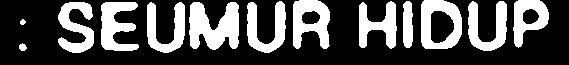

tesseract -  : : SEUMUR HIDUP

custom result -  : N3XXX14DdXW


In [52]:
import pytesseract

for roi in ktp_roi:
  # padded = cv2.copyMakeBorder(roi, 12, 12, 12, 12, cv2.BORDER_CONSTANT)
  text_roi = grab_text(roi.copy(),-1)
  pred = get_text_roi(text_roi)
  extractedInformation = pytesseract.image_to_string(text_roi)
  cv2_imshow(text_roi)
  print(f"tesseract -  : {extractedInformation}")
  print(f"custom result -  : {''.join(pred)}")


In [53]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
